In [2]:
import pandas as pd
import logging
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

In [3]:
import os

os.chdir('../..')
os.chdir('../..')
print("Current working directory:", os.getcwd())

Current working directory: /dmj/fizmed/kchorzela/licencjat/eeg-site-effects


In [4]:
save_path = f'results/tables/combat_vs_covbat'
os.makedirs(save_path, exist_ok=True)

In [58]:
feature_groups = ['all', 'coh', 'pow', 'cov']
harm_types = ['raw', 'combat', 'covbat']

In [6]:
import pickle

with open(os.path.join(save_path, "cov_matrices_data.pkl"), "rb") as f:
    cov_matrices_data = pickle.load(f)

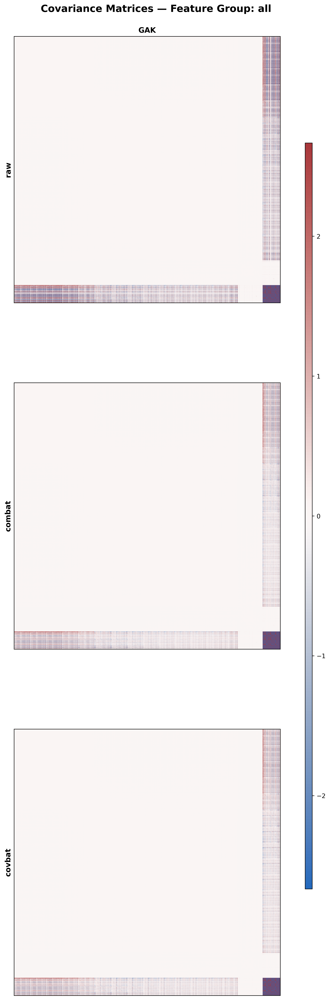

In [ ]:
hospitals_to_compare = ['GAK'] #['MOR', 'PUS', 'TER_L', 'AKS', 'CMD']
# high values: KATMOJPRZ, ARCHDAM, GAK
for fg in feature_groups:
    matrices_dict = cov_matrices_data[fg]
    
    n_harm_types = len(harm_types)
    n_hospitals = len(hospitals_to_compare)
    
    fig, axes = plt.subplots(n_harm_types, n_hospitals, 
                             figsize=(n_hospitals * 8, n_harm_types * 8), 
                             sharex=True, sharey=True, dpi=500)
    
    all_vals = np.concatenate([
        matrices_dict[h][hospital_id].values.flatten()
        for h in harm_types
        for hospital_id in hospitals_to_compare
    ])
    vmax = np.percentile(np.abs(all_vals), 99)
    vmin = -vmax
    
    for i, harm_type in enumerate(harm_types):
        for j, hospital_id in enumerate(hospitals_to_compare):
            ax = axes[i, j] if n_harm_types > 1 and n_hospitals > 1 else (
                 axes[j] if n_harm_types == 1 else axes[i])
            
            matrix_to_plot = matrices_dict[harm_type][hospital_id]
            
            ax.imshow(matrix_to_plot.values, cmap='vlag', vmin=vmin, vmax=vmax)

            
            if j == 0:
                ax.set_ylabel(harm_type, fontsize=12, fontweight='bold')
            if i == 0:
                ax.set_title(hospital_id, fontsize=12, fontweight='bold')
            
            ax.set_xticks([])
            ax.set_yticks([])
    
    # Add colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap='vlag', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    fig.colorbar(sm, cax=cbar_ax)
    
    plt.suptitle(f"Covariance Matrices — Feature Group: {fg}", fontsize=16, fontweight='bold')
    plt.subplots_adjust(left=0.05, right=0.9, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)
    
    plt.show()

In [91]:
cov_matrices_data['cov']['raw']['KUD'].loc[['cov_C4_Cz'], :]

,cov_Fp1_Fp1,cov_Fp2_Fp1,cov_Fp2_Fp2,cov_F7_Fp1,cov_F7_Fp2,cov_F7_F7,cov_F3_Fp1,cov_F3_Fp2,cov_F3_F7,cov_F3_F3,...,cov_O2_Cz,cov_O2_C4,cov_O2_T4,cov_O2_T5,cov_O2_P3,cov_O2_Pz,cov_O2_P4,cov_O2_T6,cov_O2_O1,cov_O2_O2
cov_C4_Cz,-5.96e+01,-4.81e+01,-1.22e+01,-1.40e+02,-1.17e+02,-2.05e+02,-1.68e+02,-1.69e+02,-1.80e+02,-1.49e+02,...,3.79e+03,-2.09e+02,-1.96e+02,-1.93e+02,-1.60e+02,-1.59e+02,-1.14e+02,-1.22e+02,-1.52e+01,9.23e+01


In [89]:
cov_matrices_data['cov']['raw']['KUD']

,cov_Fp1_Fp1,cov_Fp2_Fp1,cov_Fp2_Fp2,cov_F7_Fp1,cov_F7_Fp2,cov_F7_F7,cov_F3_Fp1,cov_F3_Fp2,cov_F3_F7,cov_F3_F3,...,cov_O2_Cz,cov_O2_C4,cov_O2_T4,cov_O2_T5,cov_O2_P3,cov_O2_Pz,cov_O2_P4,cov_O2_T6,cov_O2_O1,cov_O2_O2
cov_Fp1_Fp1,5.61e+03,1.95e+03,4.26e+03,1.20e+03,-7.22e+02,1.92e+03,9.46e+02,2.26e+01,5.58e+02,5.90e+02,...,-2.64e+02,1.36e+02,3.08e+02,3.73e+02,4.36e+02,4.92e+02,6.68e+02,6.72e+02,1.16e+03,1.46e+03
cov_Fp2_Fp1,1.95e+03,2.11e+03,2.70e+03,9.97e+01,1.56e+02,4.09e+02,2.33e+02,2.27e+02,9.36e+01,1.79e+02,...,-2.00e+02,8.68e+01,2.05e+02,2.39e+02,3.51e+02,4.03e+02,5.15e+02,4.01e+02,9.25e+02,1.16e+03
cov_Fp2_Fp2,4.26e+03,2.70e+03,6.76e+03,7.38e+02,-5.93e+02,1.47e+03,6.17e+02,2.83e+00,3.94e+02,4.82e+02,...,-2.05e+02,1.96e+02,3.34e+02,3.10e+02,5.42e+02,6.06e+02,7.30e+02,5.91e+02,1.30e+03,1.65e+03
cov_F7_Fp1,1.20e+03,9.97e+01,7.38e+02,7.46e+02,-2.37e+02,9.39e+02,3.36e+02,-5.26e+01,2.99e+02,2.14e+02,...,-2.38e+02,2.10e+01,8.92e+01,9.89e+01,1.10e+02,1.37e+02,2.04e+02,2.13e+02,3.96e+02,4.99e+02
cov_F7_Fp2,-7.22e+02,1.56e+02,-5.93e+02,-2.37e+02,5.33e+02,-4.11e+02,-1.66e+02,1.27e+02,-1.39e+02,-3.99e+01,...,-2.01e+02,-2.75e+01,-8.38e+00,2.56e+01,3.00e+01,4.56e+01,8.78e+01,5.42e+01,1.90e+02,2.43e+02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cov_O2_Pz,4.92e+02,4.03e+02,6.06e+02,1.37e+02,4.56e+01,2.30e+02,1.54e+02,9.93e+01,1.05e+02,2.04e+02,...,-3.08e+02,-3.69e+00,2.97e+01,7.36e+01,2.11e+02,2.91e+02,3.25e+02,1.75e+02,5.85e+02,6.95e+02
cov_O2_P4,6.68e+02,5.15e+02,7.30e+02,2.04e+02,8.78e+01,3.30e+02,2.37e+02,1.46e+02,1.51e+02,2.88e+02,...,-3.87e+02,-3.11e+01,6.82e+01,1.27e+02,2.51e+02,3.25e+02,4.99e+02,3.48e+02,8.74e+02,1.14e+03
cov_O2_T6,6.72e+02,4.01e+02,5.91e+02,2.13e+02,5.42e+01,3.46e+02,2.48e+02,1.42e+02,1.39e+02,2.49e+02,...,-4.47e+02,-7.95e+01,1.16e+02,2.17e+02,1.50e+02,1.75e+02,3.48e+02,5.52e+02,8.71e+02,1.15e+03
cov_O2_O1,1.16e+03,9.25e+02,1.30e+03,3.96e+02,1.90e+02,6.19e+02,4.52e+02,2.95e+02,2.66e+02,5.23e+02,...,-7.81e+02,-2.72e+02,8.70e+01,3.48e+02,4.77e+02,5.85e+02,8.74e+02,8.71e+02,2.92e+03,3.21e+03


In [14]:
from itertools import combinations
results = []
for fg in feature_groups:
    for harm_type, matrices in cov_matrices_data[fg].items():
        for h1, h2 in combinations(hospitals_to_compare, 2):
            matrix1 = matrices[h1]
            matrix2 = matrices[h2]
            
            distance = np.linalg.norm(matrix1 - matrix2, 'fro')
            
            results.append({
                'Harmonizacja': harm_type,
                'Para szpitali': f"{h1} vs {h2}",
                'Odległość Frobeniusa': distance
            })
    
    df_results = pd.DataFrame(results)
    df_results_2 = df_results.pivot(
        index='Para szpitali',
        columns='Harmonizacja',
        values='Odległość Frobeniusa'
    ).reset_index()
    print(fg)
    print(df_results_2)

all
Harmonizacja         Para szpitali   combat   covbat      raw
0                   ARCHDAM vs GAK 4.66e+05 4.01e+05 3.47e+06
1             ARCHDAM vs KATMOJPRZ 3.53e+05 2.73e+05 2.87e+06
2                 KATMOJPRZ vs GAK 4.01e+05 3.61e+05 2.29e+06
3                   PIO vs ARCHDAM 3.50e+05 2.52e+05 3.10e+06
4                       PIO vs GAK 4.28e+05 3.96e+05 2.23e+06
5                 PIO vs KATMOJPRZ 2.89e+05 2.53e+05 8.11e+05
6                     PIO vs ZOZLO 1.51e+05 1.47e+05 1.15e+05
7                   SZC vs ARCHDAM 3.39e+05 2.43e+05 3.12e+06
8                       SZC vs GAK 3.98e+05 3.64e+05 2.22e+06
9                 SZC vs KATMOJPRZ 2.64e+05 2.25e+05 8.05e+05
10                      SZC vs PIO 1.74e+05 1.71e+05 1.06e+05
11                    SZC vs ZOZLO 1.54e+05 1.47e+05 8.68e+04
12                ZOZLO vs ARCHDAM 3.95e+05 2.77e+05 3.17e+06
13                    ZOZLO vs GAK 4.25e+05 3.87e+05 2.24e+06
14              ZOZLO vs KATMOJPRZ 2.95e+05 2.47e+05 8.38e+05


ValueError: Index contains duplicate entries, cannot reshape

In [12]:
pd.options.display.float_format = '{:.2e}'.format

In [70]:
catboost_results = {}
for feature_group in feature_groups:
    catboost_results[feature_group] = {}
    for harm_type in harm_types:
        try:
            results_temp = pd.read_csv(os.path.join(save_path, f"{feature_group}_{harm_type}_cv_aggregated_metrics_summary.csv"), index_col=0)
            results_temp = results_temp['mean_value'][results_temp.index.str.startswith("MCC_")]
            results_temp = results_temp.drop("MCC_Overall", errors='ignore')
            catboost_results[feature_group][harm_type] = results_temp.copy()
        except FileNotFoundError:
            logging.warning(f"File not found: {feature_group}_{harm_type}_cv_aggregated_metrics_summary.csv")

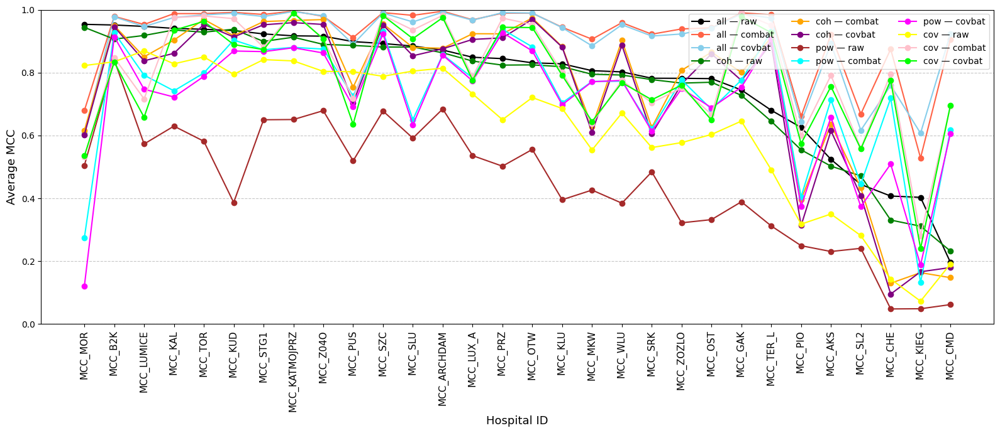

In [71]:
color_grid = [
    'black', 'tomato', 'skyblue', 'green',
    'orange', 'purple', 'brown', 'cyan',
    'magenta', 'yellow', 'pink', 'lime'
]

plt.figure(figsize=(16, 7))

reference_series = catboost_results['all']['raw']
sort_idx = reference_series.values.argsort()[::-1]
class_labels_sorted = reference_series.index.values[sort_idx]
# Loop through feature groups and harm types
for fg_idx, fg in enumerate(feature_groups):
    for ht_idx, ht in enumerate(harm_types):
        if fg in catboost_results and ht in catboost_results[fg]:
            results_series = catboost_results[fg][ht]
            mcc_values = [results_series.get(h, np.nan) for h in class_labels_sorted]

            plt.plot(
                class_labels_sorted,
                mcc_values,
                marker='o',
                linestyle='-',
                color=color_grid[(fg_idx * n_harm_types + ht_idx) % len(color_grid)],
                label=f"{fg} — {ht}"
            )

plt.ylabel("Average MCC", fontsize=13)
plt.xlabel("Hospital ID", fontsize=13)
plt.xticks(rotation=90, fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0, 1)
plt.legend(loc='upper right', fontsize=10, ncol=3)
plt.tight_layout()

plt.show()

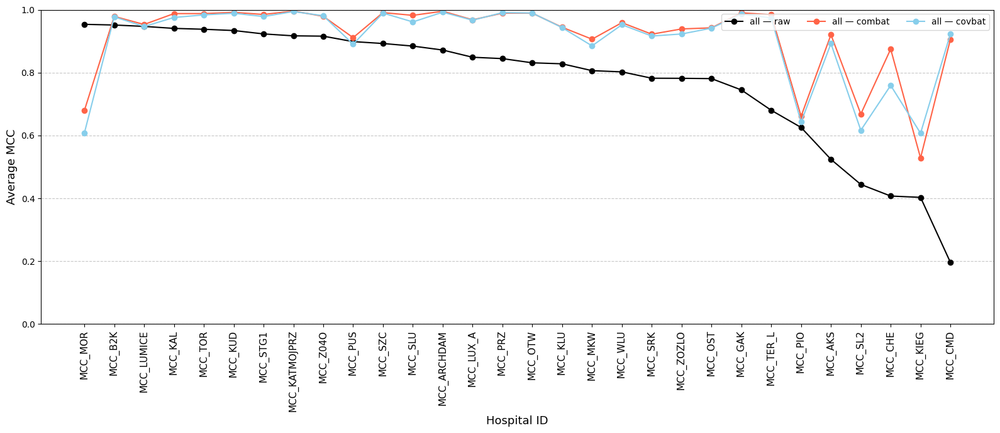

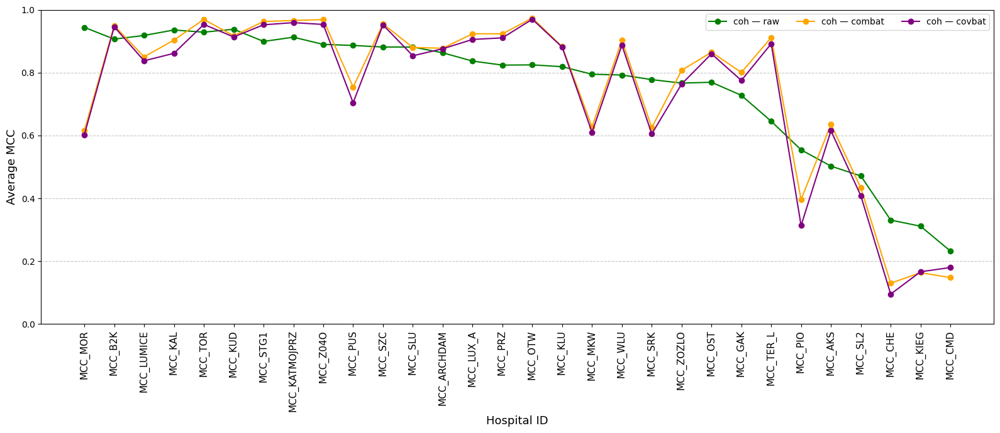

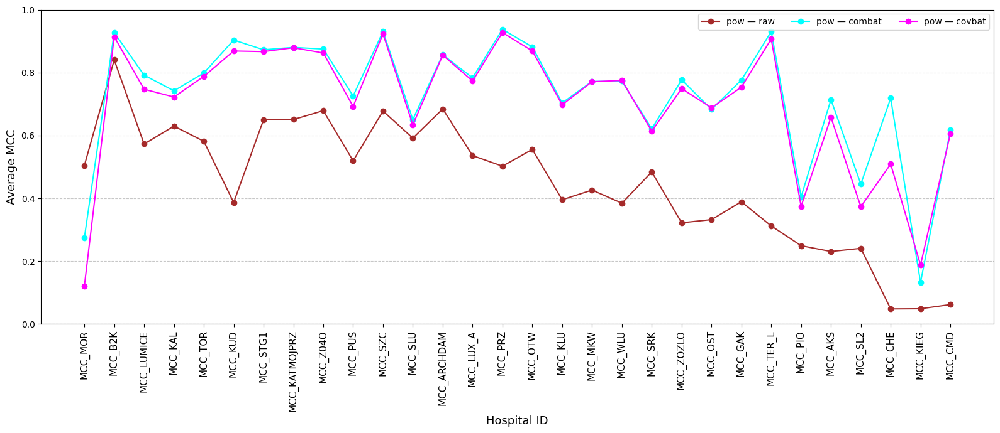

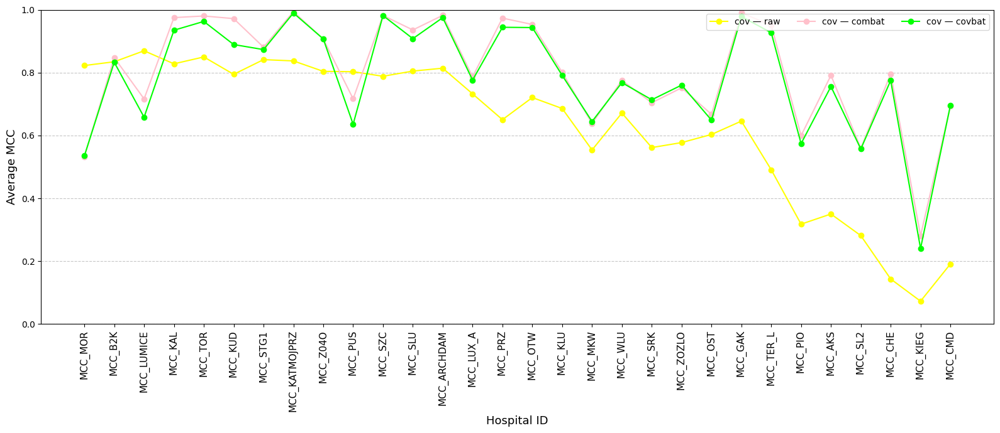

In [72]:
color_grid = [
    'black', 'tomato', 'skyblue', 'green',
    'orange', 'purple', 'brown', 'cyan',
    'magenta', 'yellow', 'pink', 'lime'
]


reference_series = catboost_results['all']['raw']
sort_idx = reference_series.values.argsort()[::-1]
class_labels_sorted = reference_series.index.values[sort_idx]
for fg_idx, fg in enumerate(feature_groups):
    plt.figure(figsize=(16, 7))

    for ht_idx, ht in enumerate(harm_types):
        if fg in catboost_results and ht in catboost_results[fg]:
            results_series = catboost_results[fg][ht]
            mcc_values = [results_series.get(h, np.nan) for h in class_labels_sorted]

            plt.plot(
                class_labels_sorted,
                mcc_values,
                marker='o',
                linestyle='-',
                color=color_grid[(fg_idx * n_harm_types + ht_idx) % len(color_grid)],
                label=f"{fg} — {ht}"
            )

    plt.ylabel("Average MCC", fontsize=13)
    plt.xlabel("Hospital ID", fontsize=13)
    plt.xticks(rotation=90, fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylim(0, 1)
    plt.legend(loc='upper right', fontsize=10, ncol=3)
    plt.tight_layout()
    
    plt.show()

In [86]:
catboost_conf_matrices = {}
for feature_group in feature_groups:
    catboost_conf_matrices[feature_group] = {}
    for harm_type in harm_types:
        try:
            results_temp = np.load(os.path.join(save_path, f"{feature_group}_{harm_type}_cv_fold_confusion_matrices.npz"), allow_pickle=True)
            catboost_conf_matrices[feature_group][harm_type] = results_temp
        except FileNotFoundError:
            logging.warning(f"File not found: {feature_group}_{harm_type}_cv_aggregated_metrics_summary.csv")

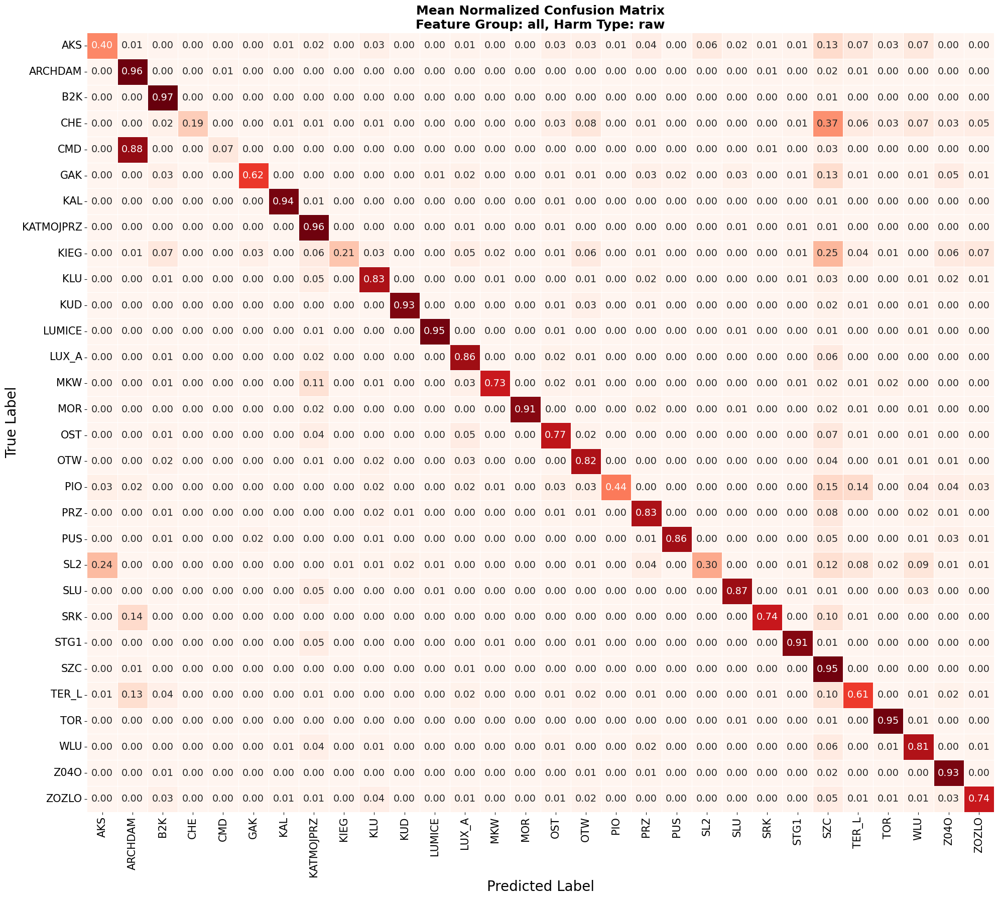

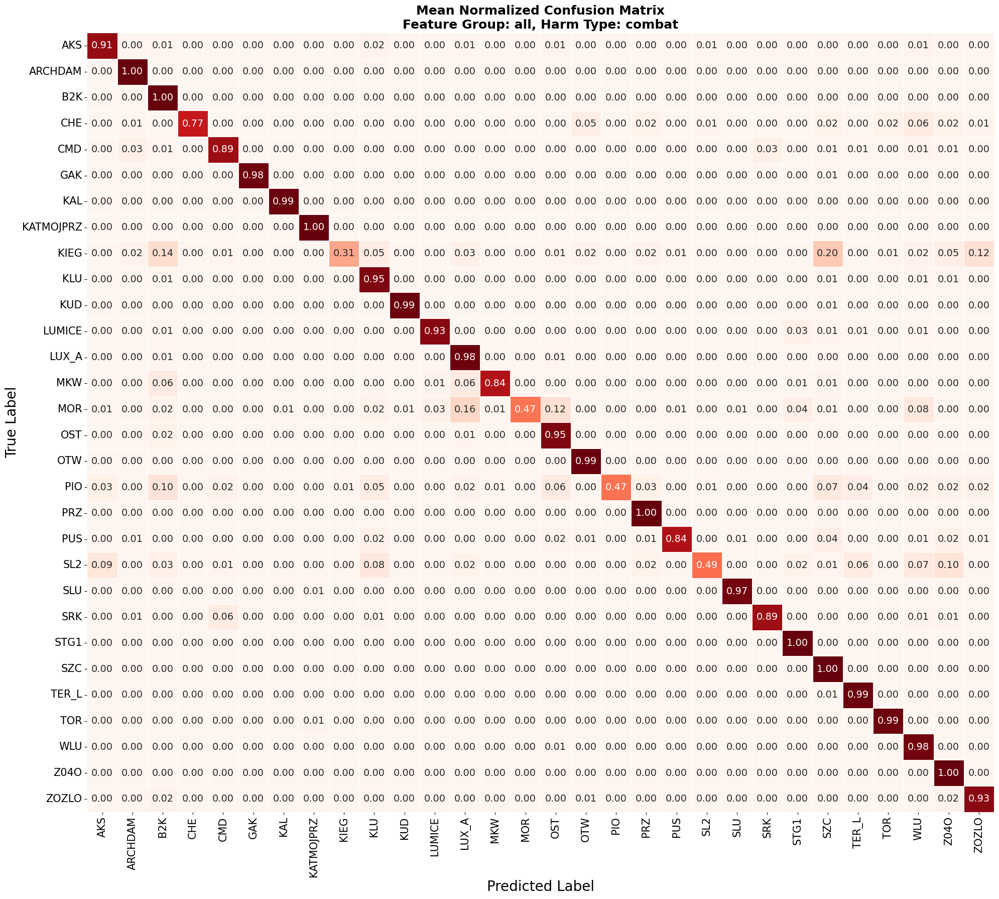

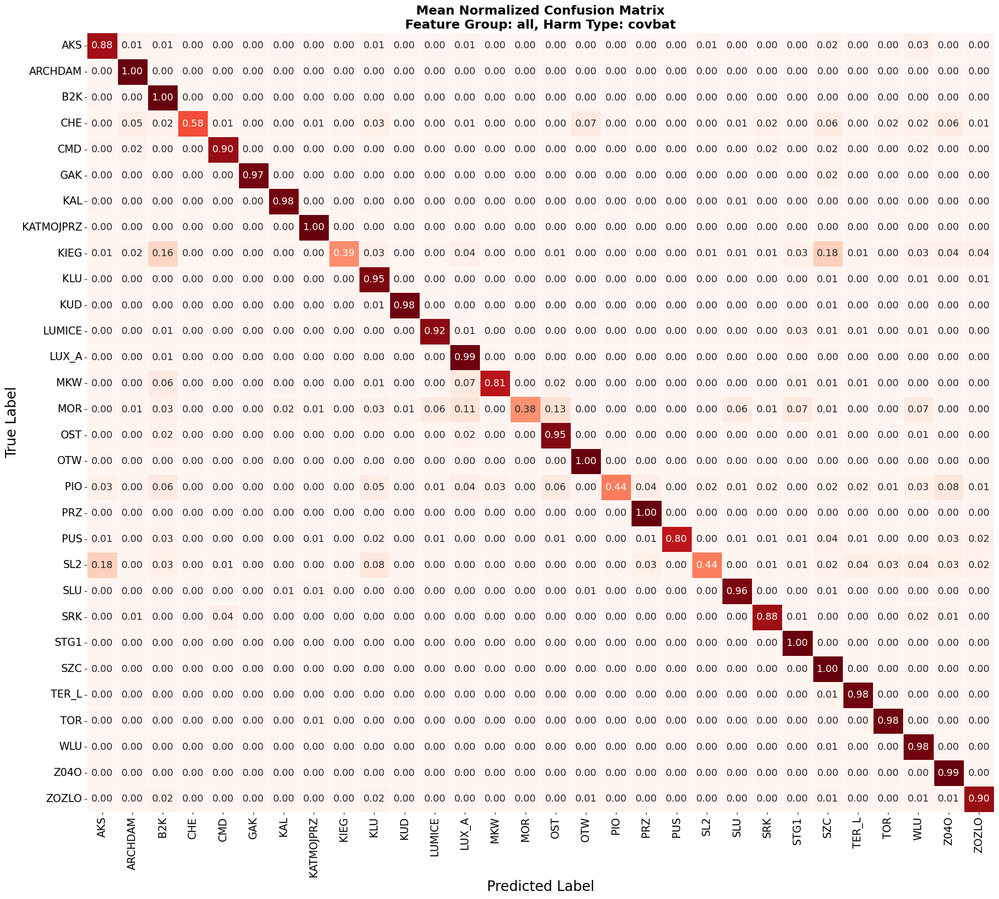

In [87]:
for fg_idx, fg in enumerate(feature_groups):
    for ht_idx, ht in enumerate(harm_types):
        if fg in catboost_results and ht in catboost_conf_matrices[fg]:
            conf_matrices_data = catboost_conf_matrices[fg][ht]
            hospital_names = list(conf_matrices_data.values())[0]
            conf_matrices = list(conf_matrices_data.values())[1:]
            mean_conf_matrix = np.sum(conf_matrices, axis=0)
            normalized_conf_matrix = mean_conf_matrix / mean_conf_matrix.sum(axis=1, keepdims=True)
            plt.figure(figsize=(20, 18))
            ax = sns.heatmap(
                normalized_conf_matrix,
                annot=True,
                fmt=".2f",
                cmap="Reds",
                linewidths=0.5,
                annot_kws={"size": 14},
                cbar=False
            )
            ax.set_xlabel("Predicted Label", fontsize=20)
            ax.set_ylabel("True Label", fontsize=20)
            plt.xticks(rotation=90)
            ax.set_xticklabels(hospital_names, fontsize=15)
            plt.yticks(rotation=0)
            ax.set_yticklabels(hospital_names, fontsize=15)
            plt.title(f"Mean Normalized Confusion Matrix\nFeature Group: {fg}, Harm Type: {ht}", fontsize=18, weight='bold')

            plt.tight_layout()
            plt.show()

In [36]:

catboost_all_results = {}
for feature_group in feature_groups:
    catboost_all_results[feature_group] = {}
    for harm_type in harm_types:
        try:
            results_temp = pd.read_csv(os.path.join(save_path, f"{feature_group}_{harm_type}_cv_fold_metrics.csv"))
            print(results_temp.columns)
            results_temp = results_temp.drop(columns=['fold']).mean().to_frame('mean_value')
            catboost_all_results[feature_group][harm_type] = results_temp.copy()
        except FileNotFoundError:
            logging.warning(f"File not found: {feature_group}_{harm_type}_cv_aggregated_metrics_summary.csv")

Index(['MCC_Overall', 'Accuracy', 'Precision (Macro)', 'Precision (Weighted)',
       'Recall (Macro)', 'Recall (Weighted)', 'F1-Score (Macro)',
       'F1-Score (Weighted)', 'AUC (OvR)', 'AUC (OvO)', 'MCC_AKS',
       'MCC_ARCHDAM', 'MCC_B2K', 'MCC_CHE', 'MCC_CMD', 'MCC_GAK', 'MCC_KAL',
       'MCC_KATMOJPRZ', 'MCC_KIEG', 'MCC_KLU', 'MCC_KUD', 'MCC_LUMICE',
       'MCC_LUX_A', 'MCC_MKW', 'MCC_MOR', 'MCC_OST', 'MCC_OTW', 'MCC_PIO',
       'MCC_PRZ', 'MCC_PUS', 'MCC_SL2', 'MCC_SLU', 'MCC_SRK', 'MCC_STG1',
       'MCC_SZC', 'MCC_TER_L', 'MCC_TOR', 'MCC_WLU', 'MCC_Z04O', 'MCC_ZOZLO',
       'fold'],
      dtype='object')
Index(['MCC_Overall', 'Accuracy', 'Precision (Macro)', 'Precision (Weighted)',
       'Recall (Macro)', 'Recall (Weighted)', 'F1-Score (Macro)',
       'F1-Score (Weighted)', 'AUC (OvR)', 'AUC (OvO)', 'MCC_AKS',
       'MCC_ARCHDAM', 'MCC_B2K', 'MCC_CHE', 'MCC_CMD', 'MCC_GAK', 'MCC_KAL',
       'MCC_KATMOJPRZ', 'MCC_KIEG', 'MCC_KLU', 'MCC_KUD', 'MCC_LUMICE',
       'MCC_L

In [37]:
catboost_all_results

{'all': {'raw':                       mean_value
  MCC_Overall             8.65e-01
  Accuracy                8.78e-01
  Precision (Macro)       8.63e-01
  Precision (Weighted)    8.74e-01
  Recall (Macro)          7.35e-01
  Recall (Weighted)       8.78e-01
  F1-Score (Macro)        7.67e-01
  F1-Score (Weighted)     8.69e-01
  AUC (OvR)               9.93e-01
  AUC (OvO)               9.88e-01
  MCC_AKS                 5.24e-01
  MCC_ARCHDAM             8.72e-01
  MCC_B2K                 9.51e-01
  MCC_CHE                 4.07e-01
  MCC_CMD                 1.96e-01
  MCC_GAK                 7.45e-01
  MCC_KAL                 9.41e-01
  MCC_KATMOJPRZ           9.17e-01
  MCC_KIEG                4.03e-01
  MCC_KLU                 8.28e-01
  MCC_KUD                 9.34e-01
  MCC_LUMICE              9.47e-01
  MCC_LUX_A               8.49e-01
  MCC_MKW                 8.06e-01
  MCC_MOR                 9.54e-01
  MCC_OST                 7.81e-01
  MCC_OTW                 8.31e-01
  MCC_